# Accessing the data and the pretrained model

In [1]:
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar

!tar -xf VOCtrainval_11-May-2012.tar

--2023-10-14 12:50:00--  http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar
Resolving host.robots.ox.ac.uk (host.robots.ox.ac.uk)... 129.67.94.152
Connecting to host.robots.ox.ac.uk (host.robots.ox.ac.uk)|129.67.94.152|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1999639040 (1.9G) [application/x-tar]
Saving to: ‘VOCtrainval_11-May-2012.tar’

VOCtrainval_11-May- 100%[===================>]   1.86G  37.7MB/s    in 54s     

2023-10-14 12:50:54 (35.5 MB/s) - ‘VOCtrainval_11-May-2012.tar’ saved [1999639040/1999639040]



In [2]:
!pip install opencv-python matplotlib xmltodict

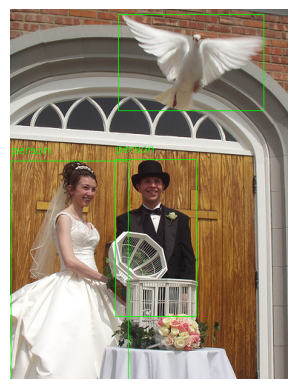

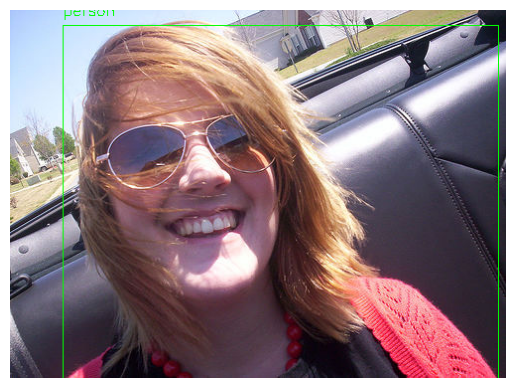

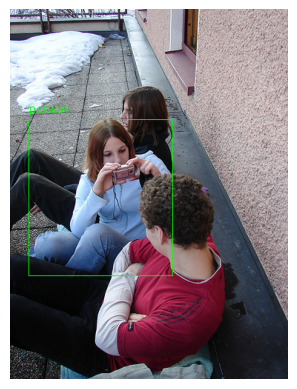

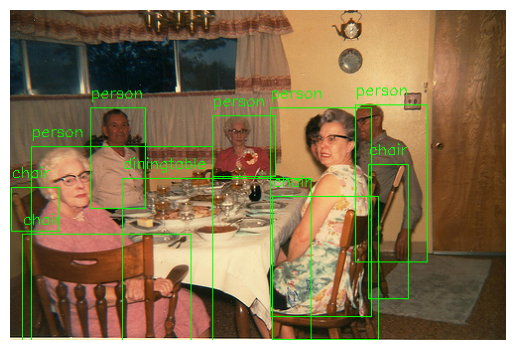

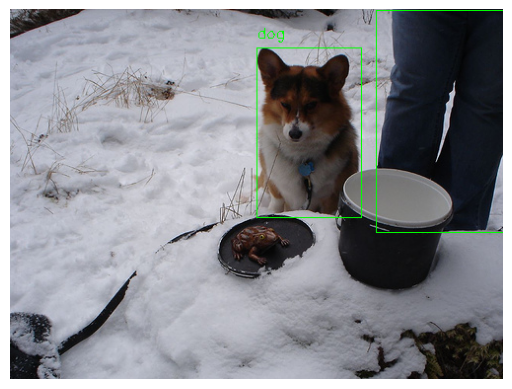

In [3]:
import cv2
import os
import xml.etree.ElementTree as ET
import matplotlib.pyplot as plt
import random

random.seed(123)

# Directory paths
IMAGE_DIR = 'VOCdevkit/VOC2012/JPEGImages/'
ANNOTATION_DIR = 'VOCdevkit/VOC2012/Annotations/'

def parse_annotation(annotation_path):
    """Parses an XML annotation file and returns the bounding boxes and their labels."""
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    boxes = []
    labels = []

    for obj in root.findall('object'):
        label = obj.find('name').text
        xmlbox = obj.find('bndbox')
        box = [int(xmlbox.find('xmin').text), int(xmlbox.find('ymin').text),
               int(xmlbox.find('xmax').text), int(xmlbox.find('ymax').text)]

        boxes.append(box)
        labels.append(label)

    return boxes, labels

def plot_image_with_boxes(img_path, boxes, labels):
    """Displays an image along with its bounding boxes."""
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    for (xmin, ymin, xmax, ymax), label in zip(boxes, labels):
        cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 1)
        cv2.putText(img, label, (xmin, ymin-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    plt.imshow(img)
    plt.axis('off')
    plt.show()

# Get list of all images and shuffle them
all_images = os.listdir(IMAGE_DIR)
random.shuffle(all_images)

# Display first few images with annotations
for img_name in all_images[10:15]:
    annotation_path = os.path.join(ANNOTATION_DIR, img_name.split('.')[0] + '.xml')
    boxes, labels = parse_annotation(annotation_path)

    img_path = os.path.join(IMAGE_DIR, img_name)
    plot_image_with_boxes(img_path, boxes, labels)


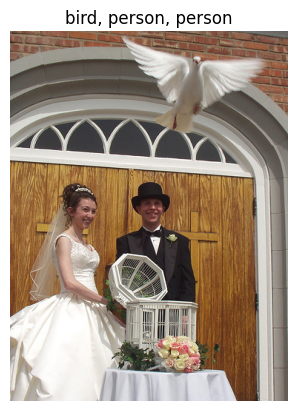

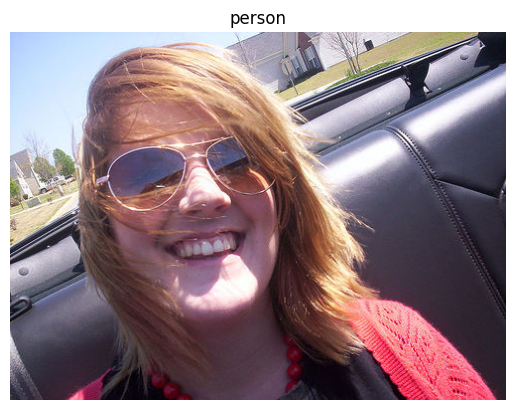

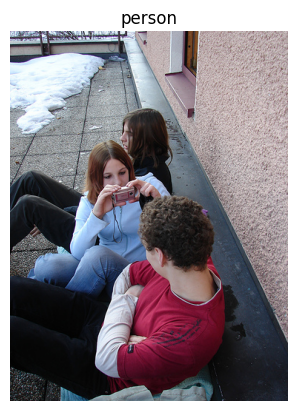

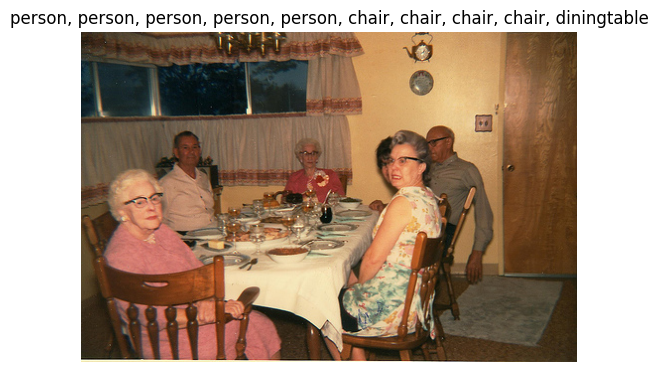

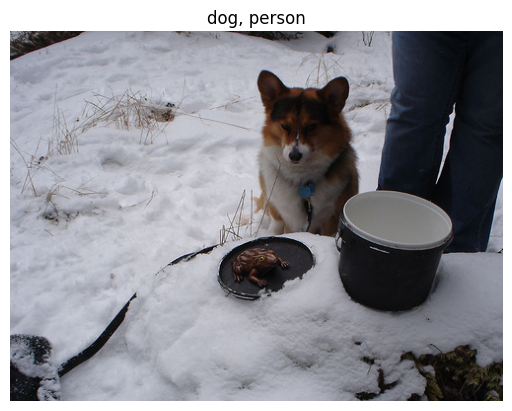

In [4]:
def plot_image_with_labels(img_path, labels):
    """Displays an image along with its labels displayed below."""
    img = cv2.imread(img_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.imshow(img)
    plt.axis('off')
    plt.title(", ".join(labels))
    plt.show()

# Display first few images with labels only (no bounding boxes)
for img_name in all_images[10:15]:
    annotation_path = os.path.join(ANNOTATION_DIR, img_name.split('.')[0] + '.xml')
    _, labels = parse_annotation(annotation_path)

    img_path = os.path.join(IMAGE_DIR, img_name)
    plot_image_with_labels(img_path, labels)


# Preparing the dataset (this part takes a very long time, so be aware when running)

PyTorch requires a custom dataset class for efficient data handling. This class should implement the `__len__` and `__getitem__ methods`.

In [20]:
import torch
import torchvision
from torchvision.transforms import functional as F

class VOCDetectionDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None):
        self.root = root
        self.transforms = transforms
        self.imgs = list(sorted(os.listdir(os.path.join(root, "JPEGImages"))))
        self.annotations = list(sorted(os.listdir(os.path.join(root, "Annotations"))))

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, "JPEGImages", self.imgs[idx])
        annotation_path = os.path.join(self.root, "Annotations", self.annotations[idx])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        boxes, labels = parse_annotation(annotation_path)
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        # Convert labels to numbers
        class_map = {"aeroplane": 1, "bicycle": 2, "bird": 3, "boat": 4, "bottle": 5,
                     "bus": 6, "car": 7, "cat": 8, "chair": 9, "cow": 10, "diningtable": 11,
                     "dog": 12, "horse": 13, "motorbike": 14, "person": 15, "pottedplant": 16,
                     "sheep": 17, "sofa": 18, "train": 19, "tvmonitor": 20}

        labels = torch.tensor([class_map[label] for label in labels])

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms:
            img = self.transforms(img)


        return img, target

transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

dataset = VOCDetectionDataset(root="VOCdevkit/VOC2012", transforms=transforms)

In [34]:
data_loader = torch.utils.data.DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

 Load a Pre-trained Faster R-CNN Model:

In [24]:
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
num_classes = 21 # 20 classes + background
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FasterRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=FasterRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth" to /root/.cache/torch/hub/checkpoints/fasterrcnn_resnet50_fpn_coco-258fb6c6.pth
100%|██████████| 160M/160M [00:01<00:00, 87.4MB/s]


In [5]:
class ObjectDetector:
    def __init__(self, model, data_loader, lr=0.005, momentum=0.9, weight_decay=0.0005):
        self.model = model
        self.data_loader = data_loader
        self.device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
        self.model.to(self.device)
        self.optimizer = self._get_optimizer(lr, momentum, weight_decay)

    def _get_optimizer(self, lr, momentum, weight_decay):
        params = [p for p in self.model.parameters() if p.requires_grad]
        return torch.optim.SGD(params, lr=lr, momentum=momentum, weight_decay=weight_decay)

    def train(self, num_epochs=10):
        for epoch in range(num_epochs):
            self.model.train()
            for images, targets in self.data_loader:
                images = list(image.to(self.device) for image in images)
                targets = [{k: v.to(self.device) for k, v in t.items()} for t in targets]

                loss_dict = self.model(images, targets)
                losses = sum(loss for loss in loss_dict.values())
                self.optimizer.zero_grad()
                losses.backward()
                self.optimizer.step()

            print(f"Epoch {epoch}/{num_epochs}, Loss: {losses.item()}")


In [19]:
trainer = ObjectDetector(model, data_loader)
trainer.train(num_epochs=10)

KeyboardInterrupt: ignored

# Training only one class - Dogs

In [22]:
def count_dogs_in_dataset(dataset):
    dog_count = 0
    for _, target in dataset:
        # Check if 'dog' (label 1) is in the labels of the current target
        if 1 in target["labels"].tolist():
            dog_count += 1
    return dog_count

total_images = len(dataset)
dog_images = count_dogs_in_dataset(dataset)

print(f"Total images in dataset: {total_images}")
print(f"Number of images containing dogs: {dog_images}")


Total images in dataset: 17125
Number of images containing dogs: 0


In [23]:
import xml.etree.ElementTree as ET

def parse_annotation(annotation_path):
    tree = ET.parse(annotation_path)
    root = tree.getroot()

    boxes = []
    labels = []

    for obj in root.findall("object"):
        label = obj.find("name").text
        if label != "dog":
            continue

        # Bounding box
        bndbox = obj.find("bndbox")
        xmin = int(bndbox.find("xmin").text)
        ymin = int(bndbox.find("ymin").text)
        xmax = int(bndbox.find("xmax").text)
        ymax = int(bndbox.find("ymax").text)
        boxes.append([xmin, ymin, xmax, ymax])
        labels.append(label)

    return boxes, labels


In [27]:
import torch
import torchvision
from torchvision.transforms import functional as F

class VOCDetectionDataset(torch.utils.data.Dataset):
    def __init__(self, root, transforms=None, skip=100):
      self.root = root
      self.transforms = transforms
      all_imgs = list(sorted(os.listdir(os.path.join(root, "JPEGImages"))))
      all_annotations = list(sorted(os.listdir(os.path.join(root, "Annotations"))))

      # Filtering for only images containing dogs
      self.imgs = []
      self.annotations = []
      for img, annotation in zip(all_imgs, all_annotations):
          annotation_path = os.path.join(self.root, "Annotations", annotation)
          _, labels = parse_annotation(annotation_path)
          if "dog" in labels:
              self.imgs.append(img)
              self.annotations.append(annotation)

      # Subsample every 5th image
      self.imgs = self.imgs[::skip]
      self.annotations = self.annotations[::skip]

    def __len__(self):
        return len(self.imgs)

    def __getitem__(self, idx):
        img_path = os.path.join(self.root, "JPEGImages", self.imgs[idx])
        annotation_path = os.path.join(self.root, "Annotations", self.annotations[idx])
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        boxes, labels = parse_annotation(annotation_path)
        boxes = torch.as_tensor(boxes, dtype=torch.float32)

        # Convert labels to numbers
        class_map = {"dog": 1}

        labels = torch.tensor([class_map[label] for label in labels])

        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((len(boxes),), dtype=torch.int64)

        target = {}
        target["boxes"] = boxes
        target["labels"] = labels
        target["image_id"] = image_id
        target["area"] = area
        target["iscrowd"] = iscrowd

        if self.transforms:
            img = self.transforms(img)


        return img, target

transforms = torchvision.transforms.Compose([
    torchvision.transforms.ToTensor()
])

dataset = VOCDetectionDataset(root="VOCdevkit/VOC2012", transforms=transforms)

total_dog_images_subsampled = len(dataset)
print(f"Number of subsampled images containing dogs: {total_dog_images_subsampled}")

data_loader = torch.utils.data.DataLoader(dataset, batch_size=2, shuffle=True, collate_fn=lambda x: tuple(zip(*x)))

In [25]:
total_images = len(os.listdir(IMAGE_DIR))
dog_images = count_dogs_in_dataset(dataset)

print(f"Total images in dataset: {total_images}")
print(f"Number of images containing dogs: {dog_images}")


Total images in dataset: 17125
Number of images containing dogs: 1341


In [31]:
class ObjectDetector:
    def __init__(self, model, data_loader, lr=0.005, momentum=0.9, weight_decay=0.0005):
        self.model = model
        self.data_loader = data_loader
        self.device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
        self.model.to(self.device)
        self.optimizer = self._get_optimizer(lr, momentum, weight_decay)

    def _get_optimizer(self, lr, momentum, weight_decay):
        params = [p for p in self.model.parameters() if p.requires_grad]
        return torch.optim.SGD(params, lr=lr, momentum=momentum, weight_decay=weight_decay)

    def train(self, num_epochs=10):
      for epoch in range(num_epochs):
          self.model.train()
          total_loss = 0.0
          for batch_num, (images, targets) in enumerate(self.data_loader):
              images = list(image.to(self.device) for image in images)
              targets = [{k: v.to(self.device) for k, v in t.items()} for t in targets]

              loss_dict = self.model(images, targets)
              losses = sum(loss for loss in loss_dict.values())
              total_loss += losses.item()

              self.optimizer.zero_grad()
              losses.backward()
              self.optimizer.step()

              print(f"Epoch {epoch}/{num_epochs}, Batch {batch_num}/{len(self.data_loader)}, Loss: {losses.item()}")

          print(f"Epoch {epoch}/{num_epochs}, Average Loss: {total_loss/len(self.data_loader)}")



In [32]:
num_classes = 2
model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=True)
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = torchvision.models.detection.faster_rcnn.FastRCNNPredictor(in_features, num_classes)


In [33]:
trainer = ObjectDetector(model, data_loader)
trainer.train(num_epochs=10)

Epoch 0/10, Batch 0/7, Loss: 0.7240366339683533
Epoch 0/10, Batch 1/7, Loss: 0.7010486721992493
Epoch 0/10, Batch 2/7, Loss: 0.2669106125831604
Epoch 0/10, Batch 3/7, Loss: 0.2245214879512787
Epoch 0/10, Batch 4/7, Loss: 0.36854279041290283
Epoch 0/10, Batch 5/7, Loss: 0.4601306915283203
Epoch 0/10, Batch 6/7, Loss: 0.21281328797340393
Epoch 0/10, Average Loss: 0.42257202523095266
Epoch 1/10, Batch 0/7, Loss: 0.21966733038425446
Epoch 1/10, Batch 1/7, Loss: 0.5655078887939453
Epoch 1/10, Batch 2/7, Loss: 0.16899675130844116
Epoch 1/10, Batch 3/7, Loss: 0.13653075695037842
Epoch 1/10, Batch 4/7, Loss: 0.15430422127246857
Epoch 1/10, Batch 5/7, Loss: 0.5262690186500549
Epoch 1/10, Batch 6/7, Loss: 0.20704424381256104
Epoch 1/10, Average Loss: 0.2826171730245863
Epoch 2/10, Batch 0/7, Loss: 0.279235303401947
Epoch 2/10, Batch 1/7, Loss: 0.19746315479278564
Epoch 2/10, Batch 2/7, Loss: 0.12772604823112488
Epoch 2/10, Batch 3/7, Loss: 0.2510369122028351
Epoch 2/10, Batch 4/7, Loss: 0.144896

In [34]:
#torch.save(trainer.model, 'trained_model.pth')
torch.save(trainer.model.state_dict(), 'model_weights.pth')

In [ ]:
# model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
# model.load_state_dict(torch.load('model_weights.pth'))
# model.eval()  # Important: set the model to evaluation mode

# Plotting the results

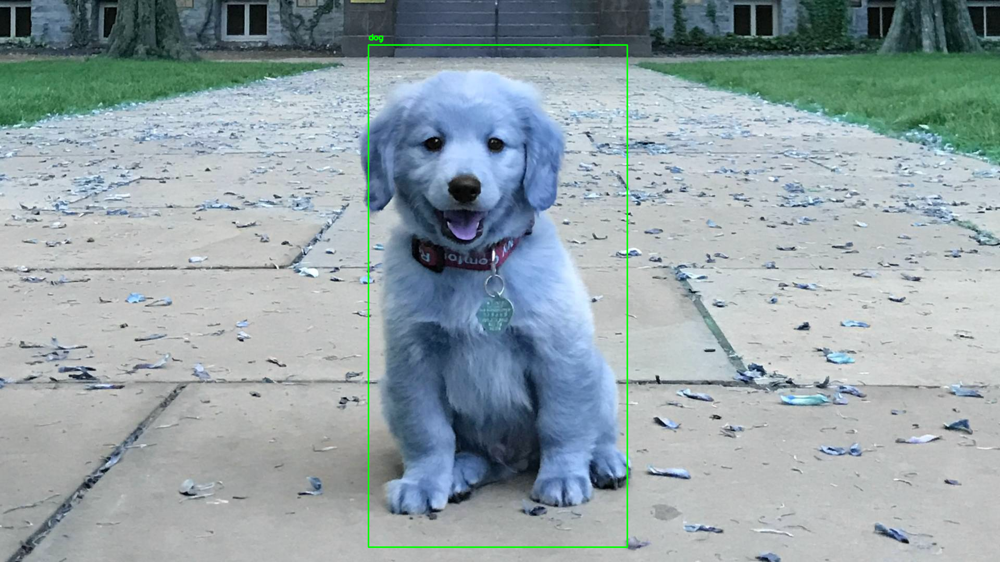

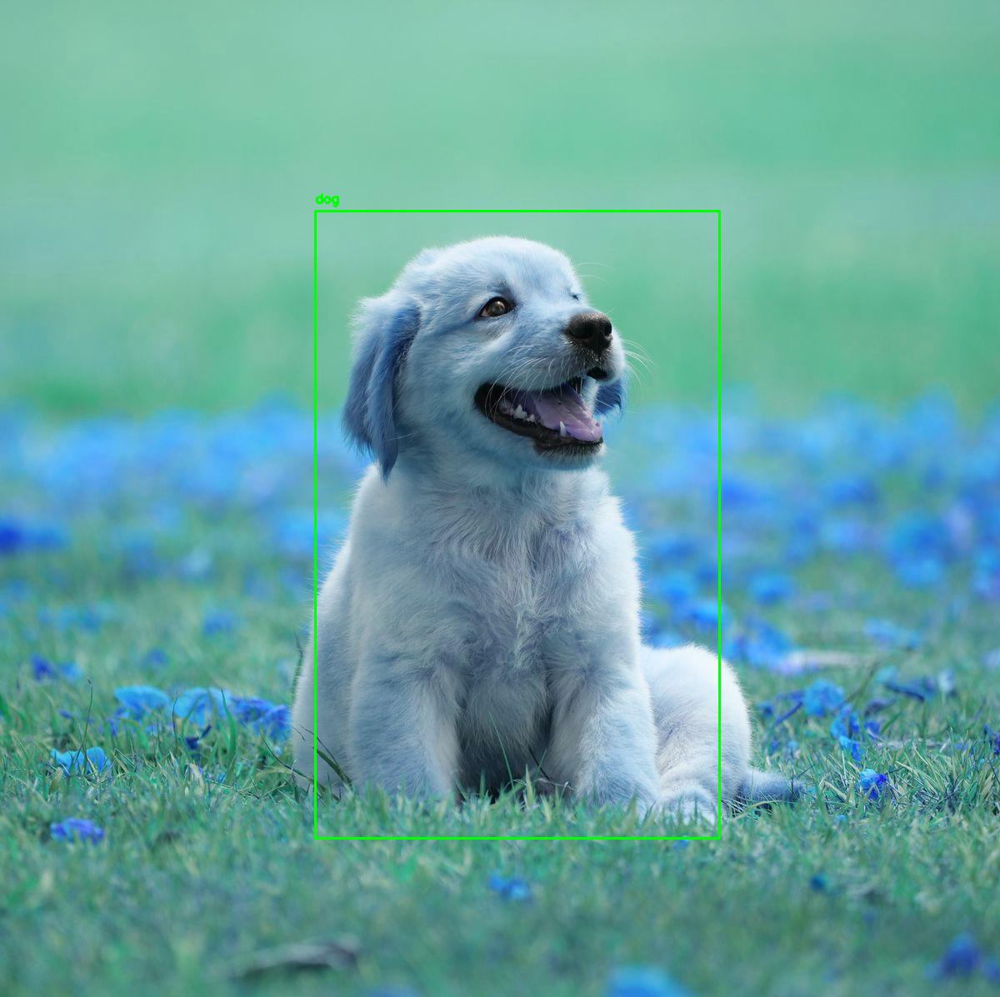

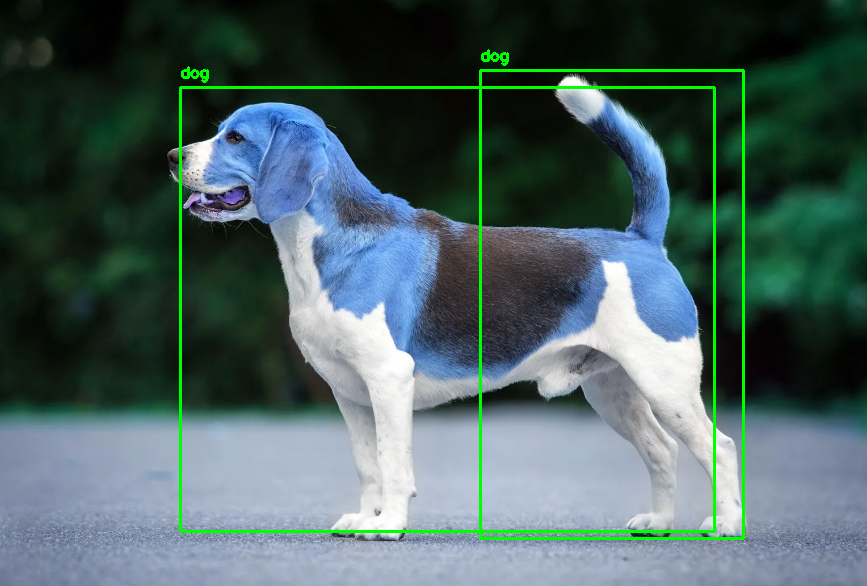

In [52]:
import cv2
import torchvision.transforms as transforms
from google.colab.patches import cv2_imshow
import torchvision

def detect_objects_in_image(image_path):
    # Load the model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
    model.load_state_dict(torch.load('model_weights.pth'))
    model.eval()  # Important: set the model to evaluation mode
    model = model.to(torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'))

    # Load and preprocess the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.ToTensor()
    ])
    image_tensor = transform(image).unsqueeze(0).to(torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'))

    # Get predictions
    with torch.no_grad():
        prediction = model(image_tensor)

    # Post-process the output (e.g., apply a confidence threshold)
    confidence_threshold = 0.5
    pred_boxes = prediction[0]['boxes'][prediction[0]['scores'] > confidence_threshold].cpu().numpy()
    pred_labels = prediction[0]['labels'][prediction[0]['scores'] > confidence_threshold].cpu().numpy()

    # Create a dictionary to map label indices to class names
    label_to_name = {
        0: "background",
        1: "dog"
    }

    # Visualize the results
    for box, label in zip(pred_boxes, pred_labels):
        cv2.rectangle(image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 255, 0), 2)
        class_name = label_to_name[label]
        cv2.putText(image, class_name, (int(box[0]), int(box[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    #resized_image = cv2.resize(image, (int(image.shape[1]), int(image.shape[0])))

    cv2_imshow(image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Example usage:
detect_objects_in_image('KOA_Nassau_2697x1517.jpg')
detect_objects_in_image('dog-photo.jpg')
detect_objects_in_image('dog_another.png')

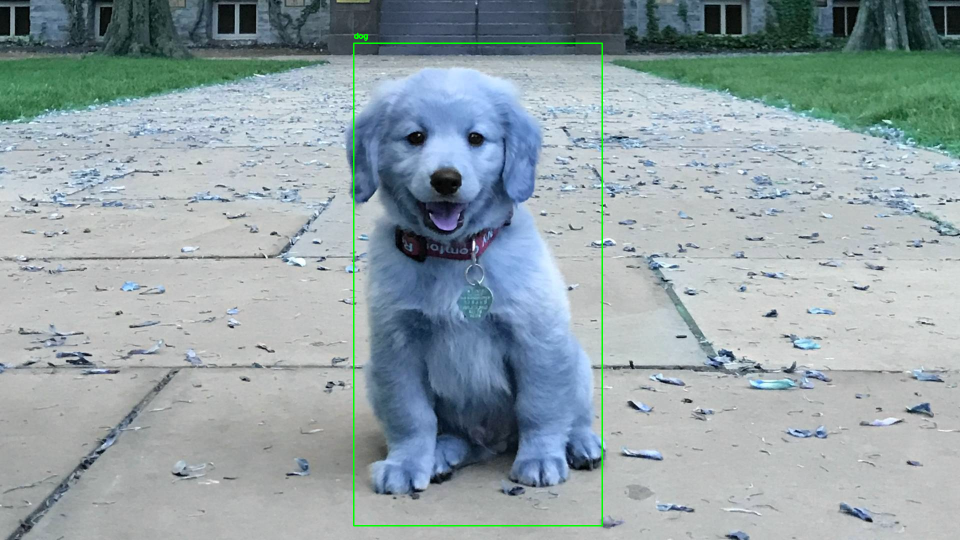

In [53]:
import cv2
import torchvision.transforms as transforms
from google.colab.patches import cv2_imshow
import torchvision

def detect_objects_in_image(image_path):
    # Load the model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
    model.load_state_dict(torch.load('model_weights.pth'))
    model.eval()  # Important: set the model to evaluation mode
    model = model.to(torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'))

    # Load and preprocess the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.ToTensor()
    ])
    image_tensor = transform(image).unsqueeze(0).to(torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'))

    # Get predictions
    with torch.no_grad():
        prediction = model(image_tensor)

    # Post-process the output (e.g., apply a confidence threshold)
    confidence_threshold = 0.5
    pred_boxes = prediction[0]['boxes'][prediction[0]['scores'] > confidence_threshold].cpu().numpy()
    pred_labels = prediction[0]['labels'][prediction[0]['scores'] > confidence_threshold].cpu().numpy()

    # Create a dictionary to map label indices to class names
    label_to_name = {
        0: "background",
        1: "dog"
    }

    # Visualize the results
    for box, label in zip(pred_boxes, pred_labels):
        cv2.rectangle(image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 255, 0), 2)
        class_name = label_to_name[label]
        cv2.putText(image, class_name, (int(box[0]), int(box[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Resize image to 1/5 of its original size for visualization
    resized_image = cv2.resize(image, (int(image.shape[1] / 2), int(image.shape[0] / 2)))

    cv2_imshow(resized_image)
    cv2.waitKey(0)
    cv2.destroyAllWindows()

# Example usage:
detect_objects_in_image('KOA_Nassau_2697x1517.jpg')

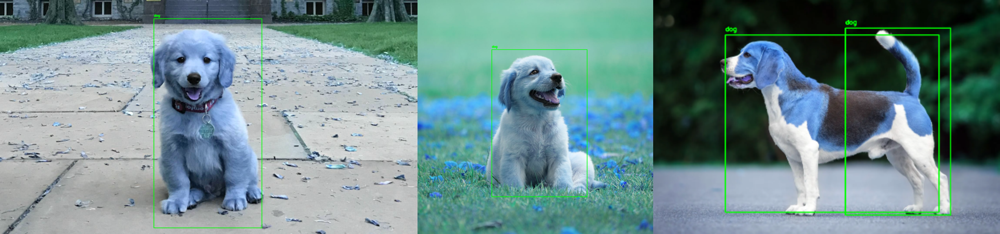

In [54]:
import cv2
import torchvision.transforms as transforms
from google.colab.patches import cv2_imshow
import torchvision

def detect_objects_in_image(image_path):
    # Load the model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn(pretrained=False, num_classes=2)
    model.load_state_dict(torch.load('model_weights.pth'))
    model.eval()  # Important: set the model to evaluation mode
    model = model.to(torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'))

    # Load and preprocess the image
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    transform = transforms.Compose([
        transforms.ToPILImage(),
        transforms.ToTensor()
    ])
    image_tensor = transform(image).unsqueeze(0).to(torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu'))

    # Get predictions
    with torch.no_grad():
        prediction = model(image_tensor)

    # Post-process the output (e.g., apply a confidence threshold)
    confidence_threshold = 0.5
    pred_boxes = prediction[0]['boxes'][prediction[0]['scores'] > confidence_threshold].cpu().numpy()
    pred_labels = prediction[0]['labels'][prediction[0]['scores'] > confidence_threshold].cpu().numpy()

    # Create a dictionary to map label indices to class names
    label_to_name = {
        0: "background",
        1: "dog"
    }

    # Visualize the results
    for box, label in zip(pred_boxes, pred_labels):
        cv2.rectangle(image, (int(box[0]), int(box[1])), (int(box[2]), int(box[3])), (0, 255, 0), 2)
        class_name = label_to_name[label]
        cv2.putText(image, class_name, (int(box[0]), int(box[1])-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    resized_image = cv2.resize(image, (int(image.shape[1] / 2), int(image.shape[0] / 2)))

    return resized_image


def display_images_in_row(images_list):
    # Determine the maximum height among all images
    max_height = max(img.shape[0] for img in images_list)

    # Resize each image in the list to match the maximum height
    resized_images = [cv2.resize(img, (int(img.shape[1] * max_height / img.shape[0]), max_height)) for img in images_list]

    # Concatenate resized images horizontally
    concatenated_image = cv2.hconcat(resized_images)

    cv2_imshow(concatenated_image)


# Process and display first 3 images
first_three = [
    detect_objects_in_image('KOA_Nassau_2697x1517.jpg'),
    detect_objects_in_image('dog-photo.jpg'),
    detect_objects_in_image('dog_another.png')
]
display_images_in_row(first_three)

As we can see it makes mistakes sometimes, for instance there is one mistake among the three images:

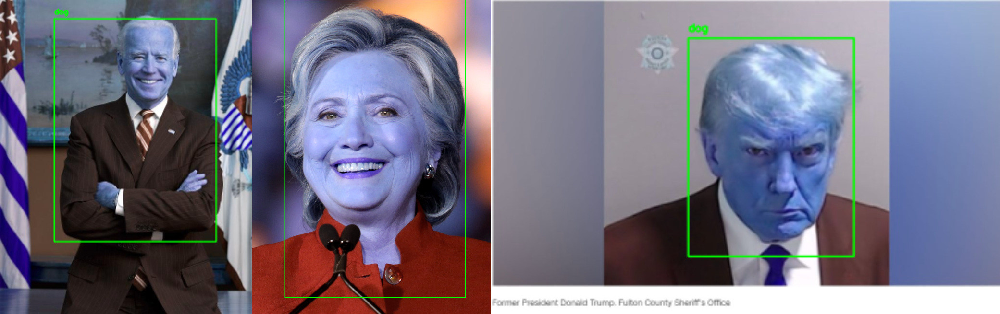

In [55]:
# Process and display next 3 images
next_three = [
    detect_objects_in_image('service-pnp-ppbd-00600-00605r.jpg'),
    detect_objects_in_image('Hillary_Clinton_Arizona_2016_.jpg'),
    detect_objects_in_image('trump.jpeg')
]
display_images_in_row(next_three)